#**Import Globals**

In [ ]:
import cv2
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.utils import normalize, to_categorical
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda, Rescaling
from keras.models import model_from_json
from sklearn.preprocessing import MinMaxScaler

import pandas as pd
import numpy as np

import glob
import numpy as np
from PIL import Image

import os
import timeit
import platform 
import numpy as np
image_tiles = []

import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import matplotlib
import random 

import numpy as np
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
def data_download(file_to_download, gdrive_code, OS, uncompress = True):
  if not os.path.exists(file_to_download):
    os.system('gdown --id "'+gdrive_code+'" --output '+file_to_download)
    if OS == "Linux" and uncompress:
        os.system('unzip -o -n "./'+file_to_download+'" -d "./"')
    return True
  else: 
    return None

In [ ]:
start_time = timeit.default_timer()
# Operating System
OS = platform.system()                           # returns 'Windows', 'Linux', etc

os.system('pip install --upgrade --no-cache-dir gdown')
out = data_download("./all_data.zip", "1e-4HsSPfoECZRMNGEEu8LIe95VVYX7Iv", OS)

print("Elapsed Time: ", timeit.default_timer() - start_time)

Elapsed Time:  16.447027649000006


#**Load each of the class models**

In [ ]:
def load_model(name):
  json_file = open("./models/" + name +'_model.json', 'r')
  loaded_model_json = json_file.read()
  json_file.close()
  internal_model = model_from_json(loaded_model_json)
  internal_model.load_weights("./models/" + name+"_model.h5")
  return internal_model

buildings_model = load_model('buildings')
roads_model = load_model('roads')
trees_model = load_model('trees')
waterways_model = load_model('waterways')
vehicles_model = load_model('vehicles')


# **Create tiles from a big test tile**

In [ ]:
def create_tiles_from_big_image(tile_num):
  image_tiles = []

  image_path = './tiles/' + tile_num + '.jpg'

  img = cv2.imread(image_path)
  print(img.shape)
  img = cv2.resize(img, (3584,3584), interpolation = cv2.INTER_AREA)
  print(img.shape)

  for r in range(0,img.shape[0],256):
      for c in range(0,img.shape[1],256):
          tile = img[r:r+256, c:c+256,:]
          cv2.imwrite(f"tmp_img.jpg",tile)
          tile = cv2.imread(f"tmp_img.jpg")
          
          #NB!!!! BY DEFAULT CV reads in BGR, so have to convert again to RGB
          tile = cv2.cvtColor(tile, cv2.COLOR_BGR2RGB)
          image_tiles.append(tile)
  image_tiles = np.asarray(image_tiles)
  print (image_tiles.shape)
  
  return image_tiles

#**Predict Tiles**

In [ ]:
def predict_tiles(modelToUse, imageTiles):
    pred_tiles = []
    for t in imageTiles:
      test_predicted =  (np.reshape(modelToUse.predict(np.reshape(t, (1, 256, 256, 3))), (256, 256)).astype(np.float32) * 255).astype("uint8")
      pred_tiles.append(test_predicted)
    pred_tiles = np.asarray(pred_tiles)
    
    return pred_tiles

#**Create big tile from pieces**

In [ ]:
from PIL import Image

def tiles_to_image(tiles, dimension, tile_size, filename, must_display):
  new_image = Image.new('RGB',(dimension, dimension), (250,250,250))
  row = 0;
  column = 0;
  width = 0;

  for i in range(0, tiles.shape[0],1):
    width = column*tile_size;
    height = row *tile_size
    image = Image.fromarray(np.uint8(tiles[i]))
    Image.Image.paste(new_image, image, (width, height))
    
    column = column + 1
    if width >= (dimension-tile_size):
        width = 0;
        row = row + 1
        column = 0
  new_image.save(filename + ".jpg","JPEG")
  
  if must_display == True:
    display(new_image)
  
  return np.array(new_image)

#**Colour Masks for each class**

In [ ]:
def create_colour_masks(name, colour):
  mask = Image.open("./"+name+"_mask.jpg", "r")
  mask = np.array(mask)
  # colour = (colour[2], colour[1], colour[0]) #switch colour channels to make it RGB
  mask = np.where(mask < 127,0,colour)
  return mask

In [ ]:
def plot_img(img, size = (10,10)):
  fig = plt.figure()
  plt.figure(figsize = size)
  plt.imshow(img,)
  fig.tight_layout()

#**Superimpose images**

In [ ]:
def predict_image(tile_name, alpha_building, alpha_road, alpha_tree, alpha_waterway, alpha_vehicle, interpolation, show_tile, verbose):
  image_path = './tiles/' + tile_name + '.jpg'
  fig_size = (12,12)

  image_tiles = create_tiles_from_big_image(tile_name)
  building_pred_tiles = predict_tiles(buildings_model, image_tiles)
  road_pred_tiles = predict_tiles(roads_model, image_tiles)
  trees_pred_tiles = predict_tiles(trees_model, image_tiles)
  waterways_pred_tiles = predict_tiles(waterways_model, image_tiles)
  vehicle_pred_tiles = predict_tiles(vehicles_model, image_tiles)

  building_mask = tiles_to_image(building_pred_tiles, 3584, 256, "building_mask", False)
  road_mask = tiles_to_image(road_pred_tiles, 3584, 256, "road_mask", False)
  tree_mask = tiles_to_image(trees_pred_tiles, 3584, 256, "tree_mask", False)
  waterway_mask = tiles_to_image(waterways_pred_tiles, 3584, 256, "waterway_mask", False)
  vehicle_mask = tiles_to_image(vehicle_pred_tiles, 3584, 256, "vehicle_mask", False)


  if show_tile == True:
    img = cv2.imread(image_path)
    # img = cv2.resize(img, (700,700), interpolation = cv2.INTER_AREA)
    # cv2_imshow(img)
    fig = plt.figure()
    plt.figure(figsize = fig_size)
    plt.axis("off")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    fig.tight_layout()

  building_mask_colour = create_colour_masks("building",[128,64,128])
  road_mask_colour = create_colour_masks("road",[230,230,23])
  tree_mask_colour = create_colour_masks("tree",[45,200,40])
  waterway_mask_colour = create_colour_masks("waterway",[30,90,240])
  vehicle_mask_colour = create_colour_masks("vehicle",[200,50,20])


  if verbose == True:
    plt.axis("off")
    plot_img(building_mask_colour, (8,8))
    plot_img(road_mask_colour, (8,8))
    plot_img(tree_mask_colour, (8,8))
    plot_img(waterway_mask_colour, (8,8))
    plot_img(vehicle_mask_colour, (8,8))
    fig = plt.figure()
    fig.set_figheight(30)
    fig.set_figwidth(30)
    ax1 = fig.add_subplot(231)
    ax1.imshow(building_mask_colour)
    ax2 = fig.add_subplot(232)
    ax2.imshow(road_mask_colour)
    ax3 = fig.add_subplot(233)
    ax3.imshow(tree_mask_colour)
    ax4 = fig.add_subplot(234)
    ax4.imshow(waterway_mask_colour)
    ax5 = fig.add_subplot(235)
    ax5.imshow(vehicle_mask_colour)
    plt.show()

  fig = plt.figure()
  plt.figure(figsize = fig_size)
  plt.imshow(road_mask_colour, alpha = alpha_road, interpolation = interpolation)
  plt.imshow(tree_mask_colour, alpha = alpha_tree)
  plt.imshow(building_mask_colour, alpha = alpha_building, interpolation=interpolation)
  plt.imshow(waterway_mask_colour, alpha = alpha_waterway, interpolation=interpolation)
  plt.imshow(vehicle_mask_colour, alpha = alpha_vehicle, interpolation=interpolation)
  plt.axis("off")
  fig.tight_layout()



(3600, 3600, 3)
(3584, 3584, 3)
(196, 256, 256, 3)
Elapsed Time:  63.82530626400012


<Figure size 432x288 with 0 Axes>

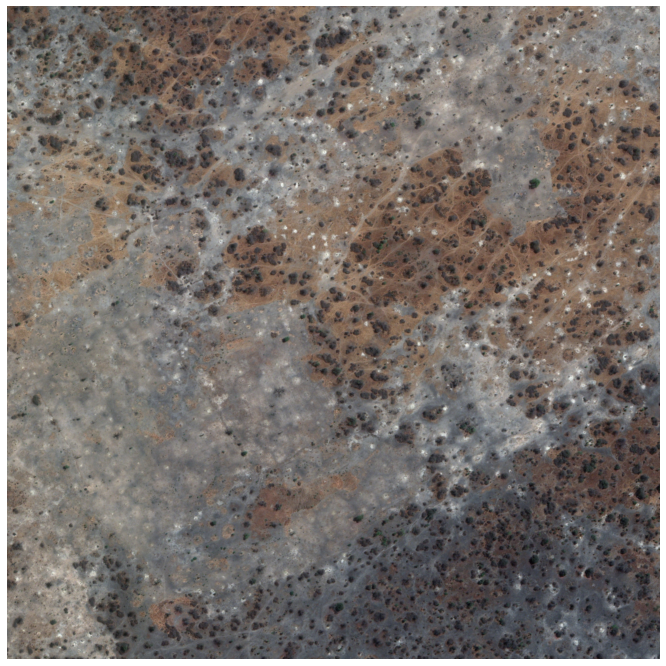

<Figure size 432x288 with 0 Axes>

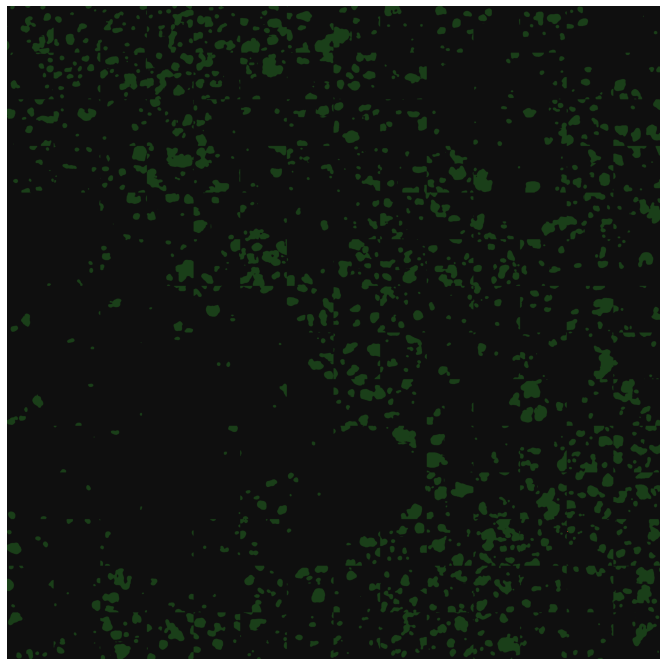

In [ ]:
start_time = timeit.default_timer()
predict_image('2', 0.0, 0.6, 0.6, 0.0, 0.6, 'none', True, False )
print("Elapsed Time: ", timeit.default_timer() - start_time)

(3600, 3600, 3)
(3584, 3584, 3)
(196, 256, 256, 3)
Elapsed Time:  53.84633429099995


<Figure size 432x288 with 0 Axes>

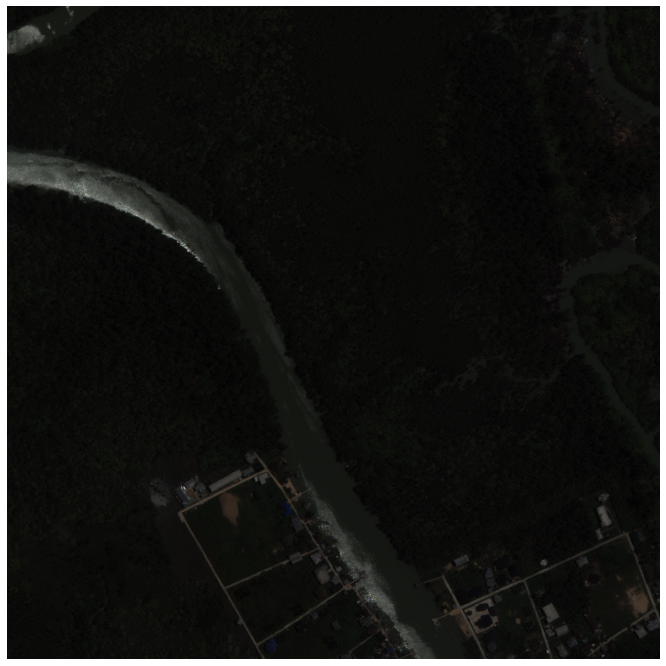

<Figure size 432x288 with 0 Axes>

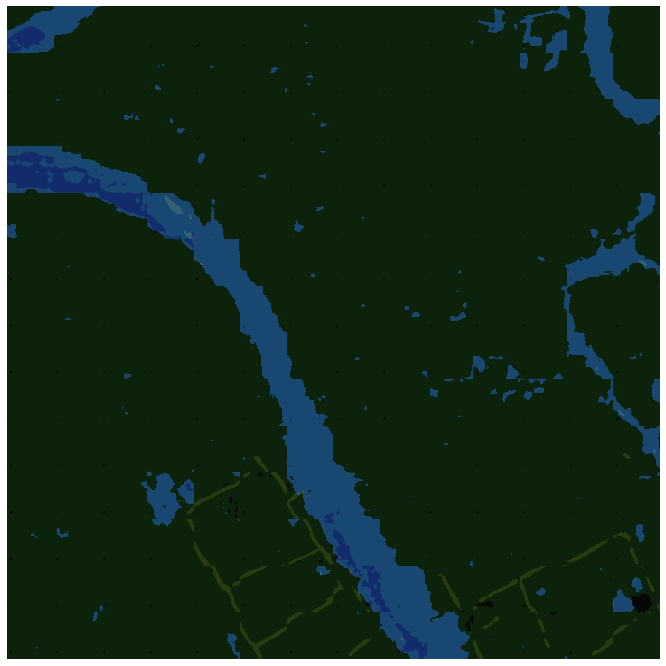

In [ ]:
start_time = timeit.default_timer()
predict_image('8', 0.0, 0.8, 0.5, 0.6, 0.3, 'none', True, False )
print("Elapsed Time: ", timeit.default_timer() - start_time)

(3600, 3600, 3)
(3584, 3584, 3)
(196, 256, 256, 3)
Elapsed Time:  52.83094693299995


<Figure size 432x288 with 0 Axes>

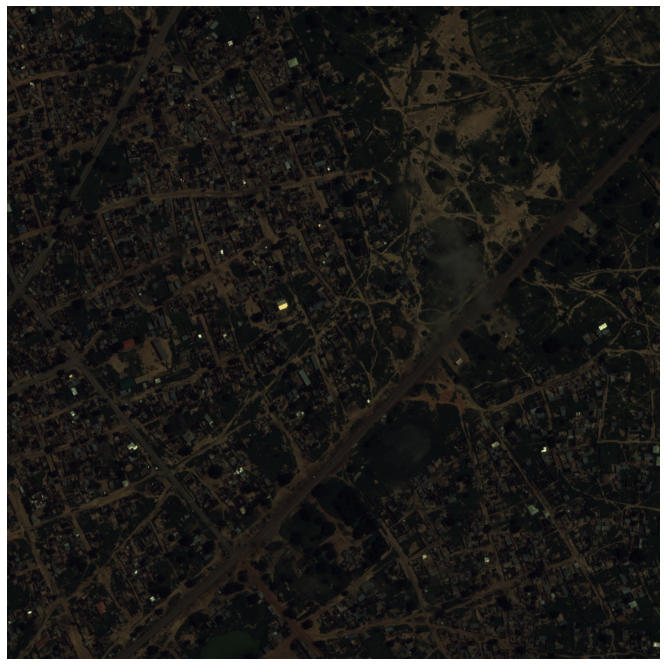

<Figure size 432x288 with 0 Axes>

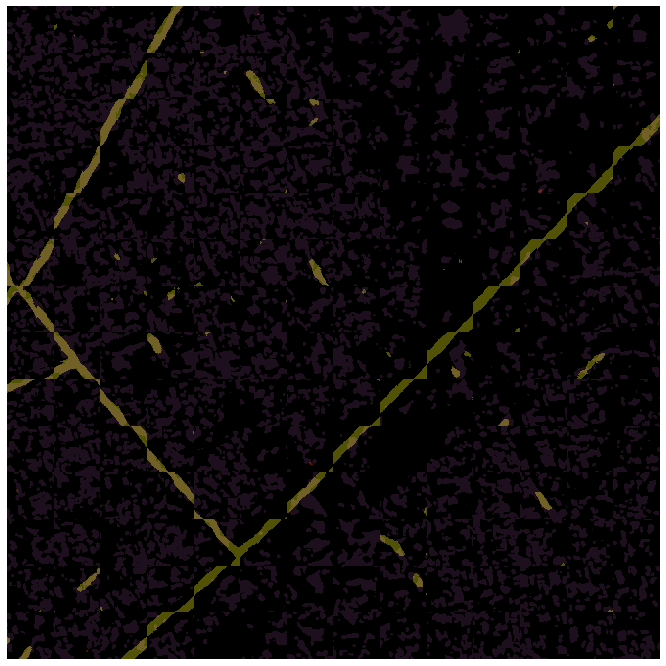

In [ ]:
start_time = timeit.default_timer()
predict_image('9', 0.4, 1, 0.0, 0.0, 0.4, 'none', True, False )
print("Elapsed Time: ", timeit.default_timer() - start_time)

(3600, 3600, 3)
(3584, 3584, 3)
(196, 256, 256, 3)
Elapsed Time:  51.793222103999824


<Figure size 432x288 with 0 Axes>

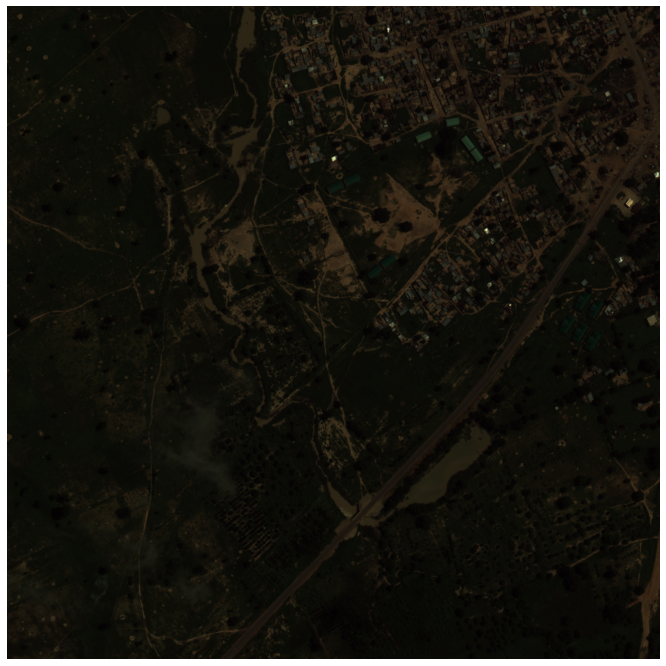

<Figure size 432x288 with 0 Axes>

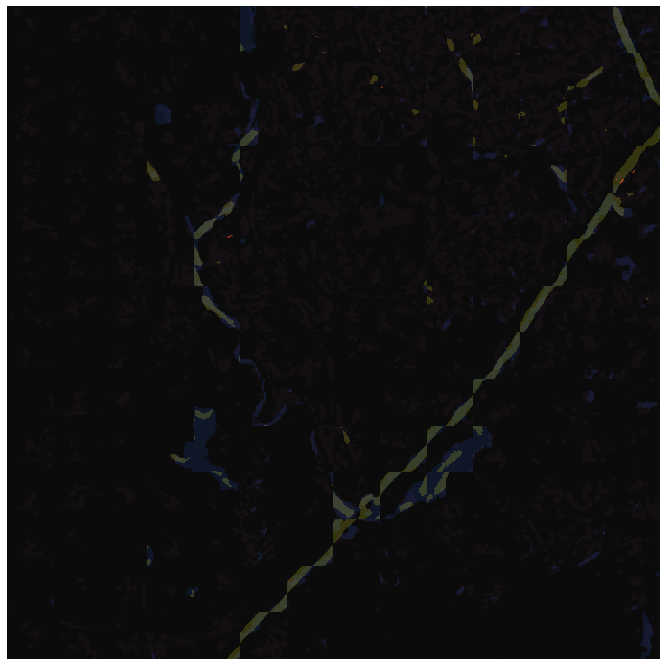

In [ ]:
start_time = timeit.default_timer()
predict_image('10', 0.2, 0.8, 0.0, 0.3, 0.6, 'none', True, False )
print("Elapsed Time: ", timeit.default_timer() - start_time)

(3600, 3600, 3)
(3584, 3584, 3)
(196, 256, 256, 3)
Elapsed Time:  48.5159686700008


<Figure size 432x288 with 0 Axes>

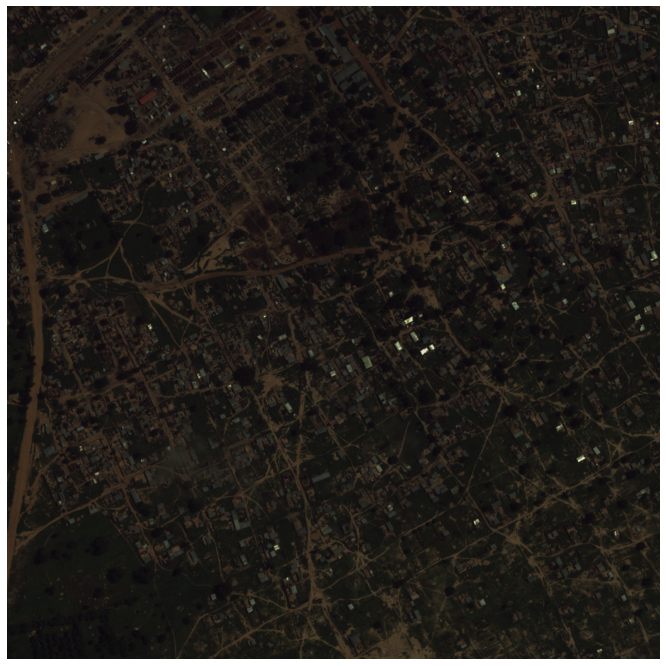

<Figure size 432x288 with 0 Axes>

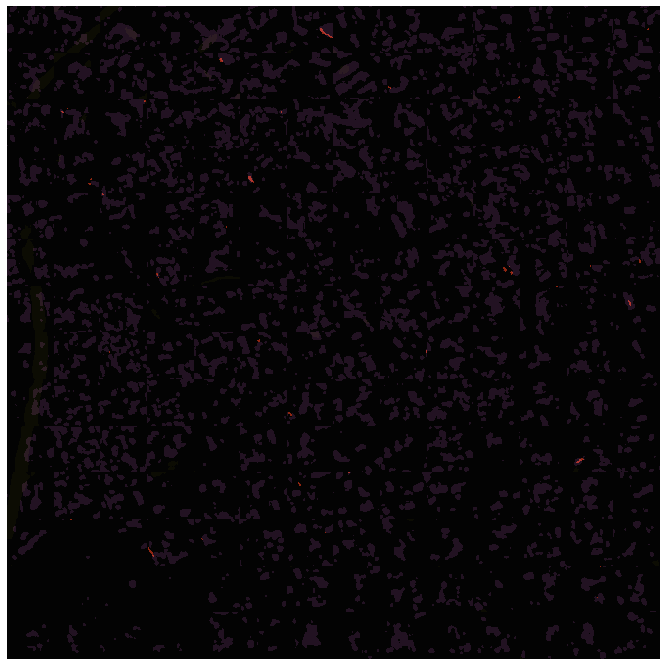

In [ ]:
start_time = timeit.default_timer()
predict_image('11', 0.8, 0.7, 0.0, 0.0, 0.7, 'none', True, False )
print("Elapsed Time: ", timeit.default_timer() - start_time)

(3600, 3600, 3)
(3584, 3584, 3)
(196, 256, 256, 3)
Elapsed Time:  51.500551509999696


<Figure size 432x288 with 0 Axes>

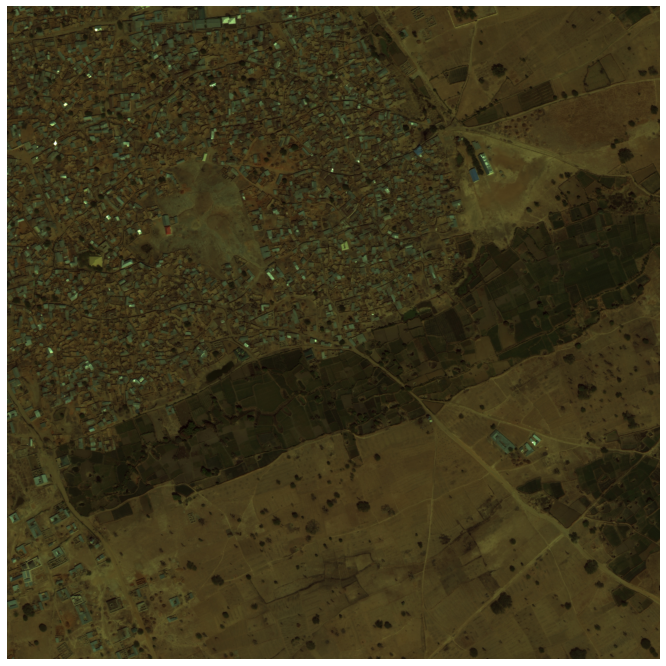

<Figure size 432x288 with 0 Axes>

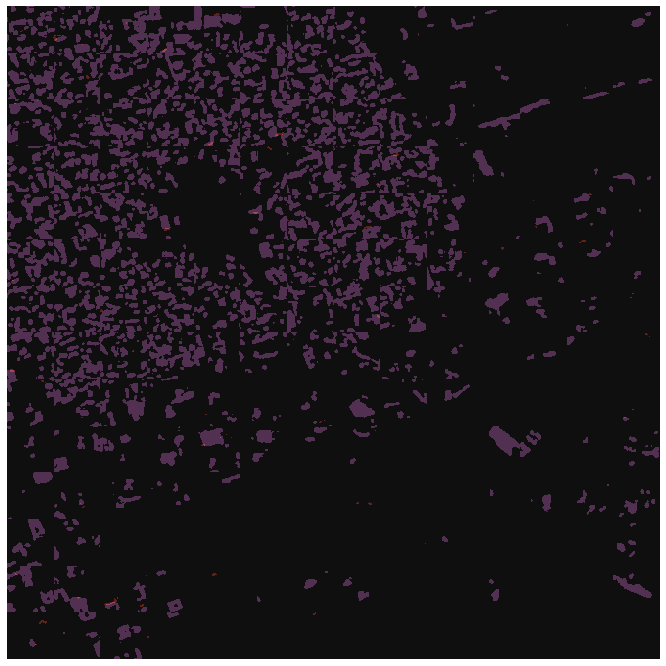

In [ ]:
start_time = timeit.default_timer()
predict_image('12', 0.9, 0.1, 0.0, 0.0, 0.4, 'none', True, False )
print("Elapsed Time: ", timeit.default_timer() - start_time)

(3600, 3600, 3)
(3584, 3584, 3)
(196, 256, 256, 3)
Elapsed Time:  51.767105808


<Figure size 432x288 with 0 Axes>

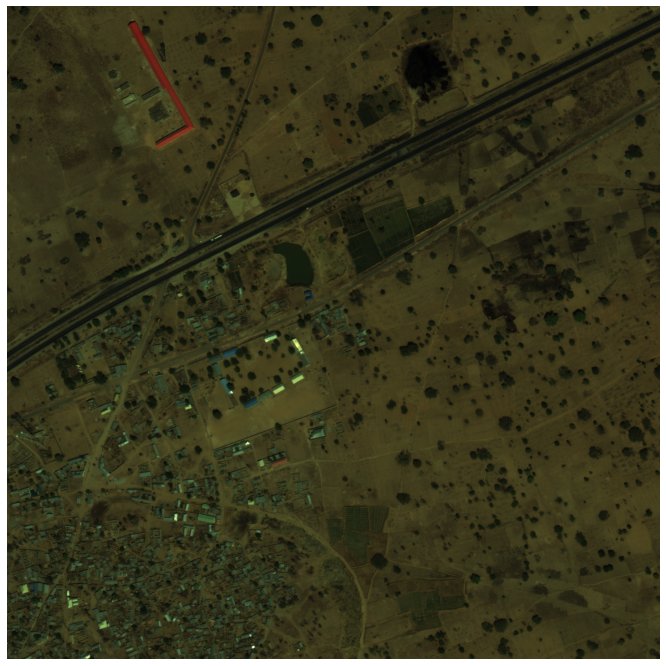

<Figure size 432x288 with 0 Axes>

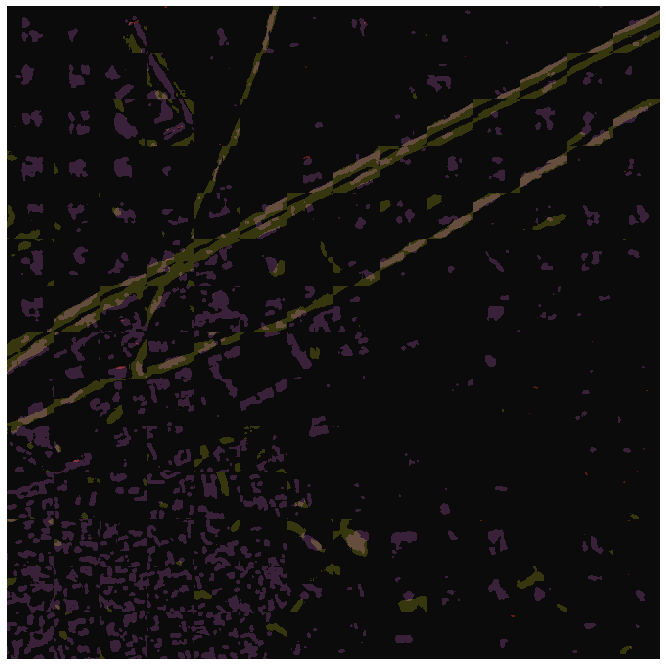

In [ ]:
start_time = timeit.default_timer()
predict_image('13', 0.6, 0.8, 0.0, 0.0, 0.4, 'nearest', True, False )
print("Elapsed Time: ", timeit.default_timer() - start_time)

(3600, 3600, 3)
(3584, 3584, 3)
(196, 256, 256, 3)
Elapsed Time:  51.37924781599986


<Figure size 432x288 with 0 Axes>

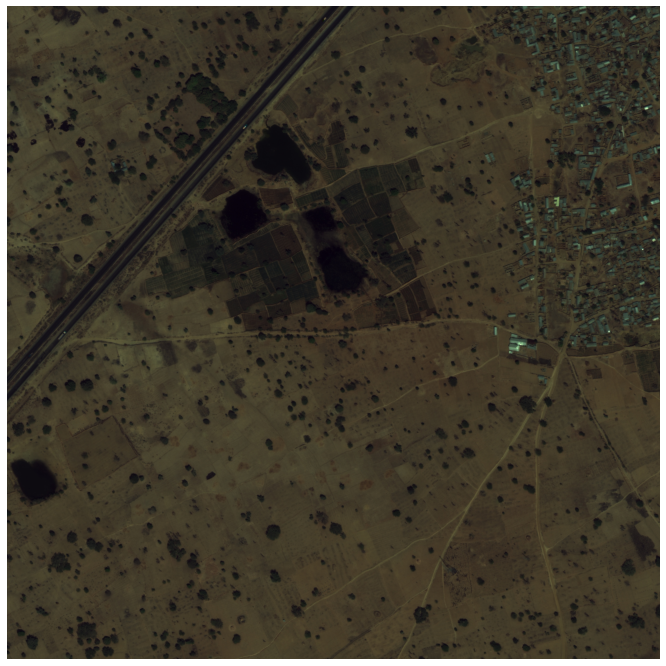

<Figure size 432x288 with 0 Axes>

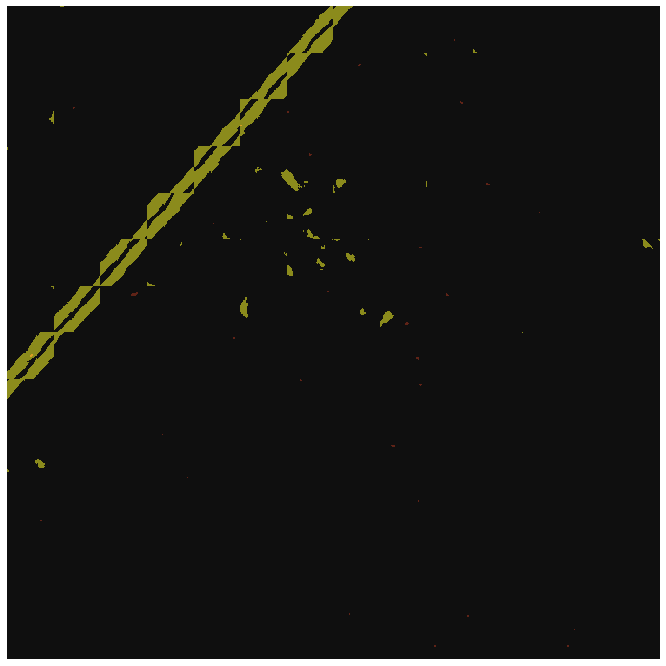

In [ ]:
start_time = timeit.default_timer()
predict_image('14', 0.0, 0.9, 0.0, 0.0, 0.4, 'none', True, False )
print("Elapsed Time: ", timeit.default_timer() - start_time)

(3600, 3600, 3)
(3584, 3584, 3)
(196, 256, 256, 3)
Elapsed Time:  51.61921272900008


<Figure size 432x288 with 0 Axes>

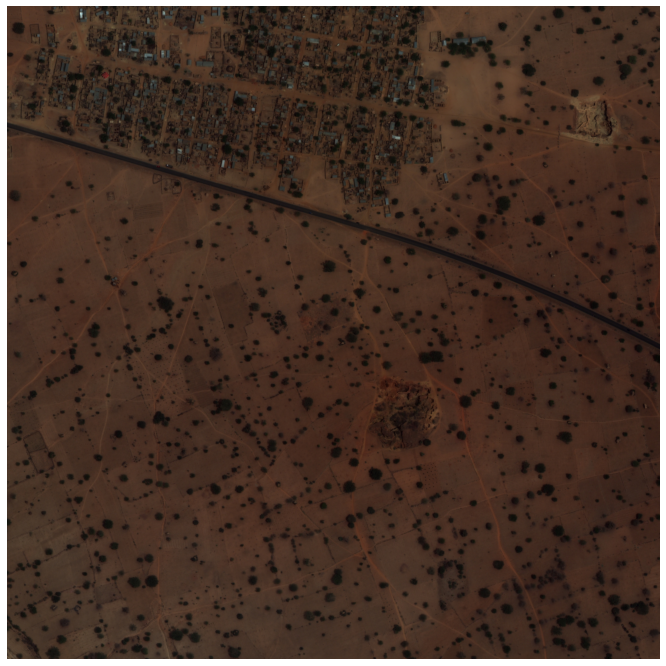

<Figure size 432x288 with 0 Axes>

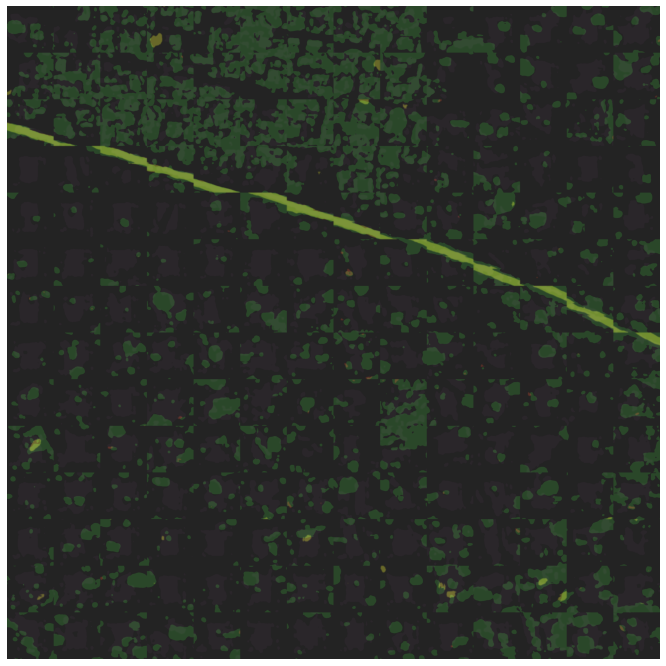

In [ ]:
start_time = timeit.default_timer()
predict_image('15', 0.1, 0.7, 0.3, 0.0, 0.3, 'gaussian', True, False )
print("Elapsed Time: ", timeit.default_timer() - start_time)

(3600, 3600, 3)
(3584, 3584, 3)
(196, 256, 256, 3)
Elapsed Time:  51.25689631000023


<Figure size 432x288 with 0 Axes>

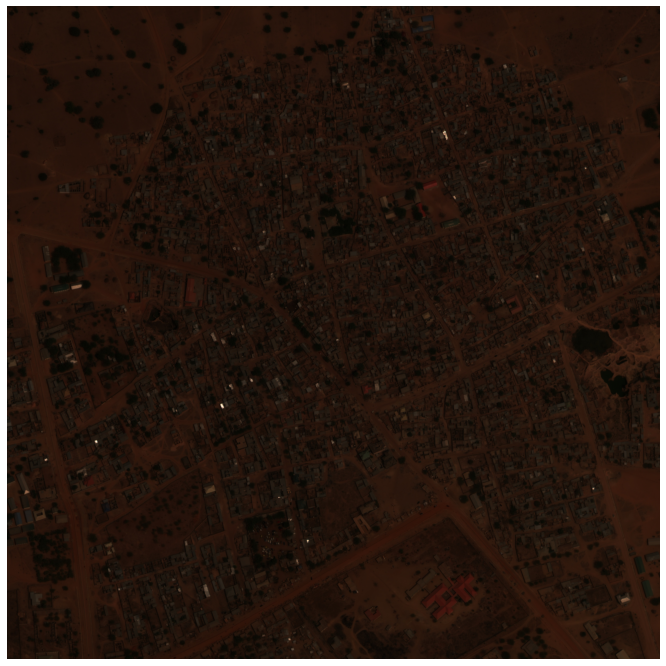

<Figure size 432x288 with 0 Axes>

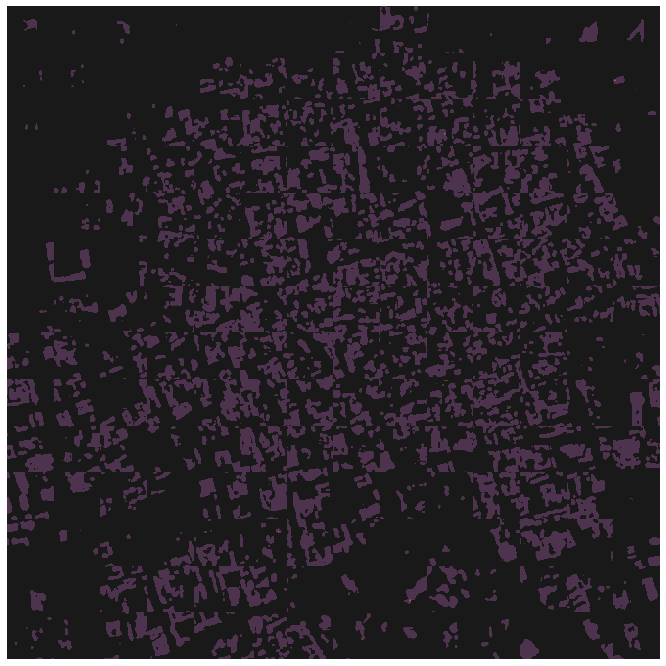

In [ ]:
start_time = timeit.default_timer()
predict_image('16', 0.8, 0.0, 0.0, 0.0, 0.5, 'none', True, False )
print("Elapsed Time: ", timeit.default_timer() - start_time)

(3600, 3600, 3)
(3584, 3584, 3)
(196, 256, 256, 3)
Elapsed Time:  51.59645173999979


<Figure size 432x288 with 0 Axes>

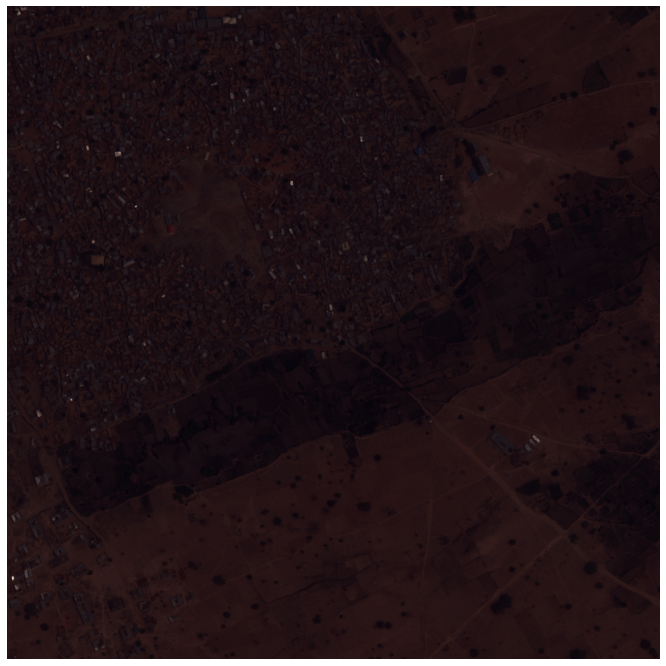

<Figure size 432x288 with 0 Axes>

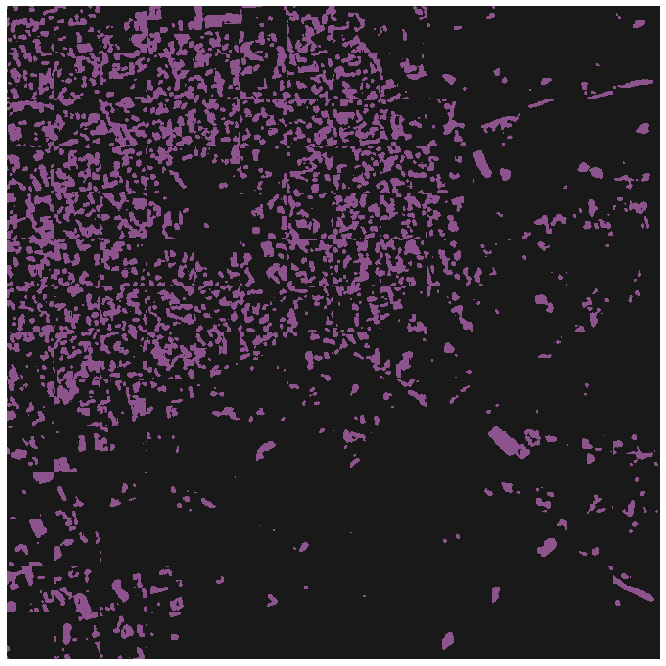

In [ ]:
start_time = timeit.default_timer()
predict_image('17', 0.9, 0.0, 0.0, 0.0, 0.0, 'none', True, False )
print("Elapsed Time: ", timeit.default_timer() - start_time)

(3600, 3600, 3)
(3584, 3584, 3)
(196, 256, 256, 3)
Elapsed Time:  51.468099274


<Figure size 432x288 with 0 Axes>

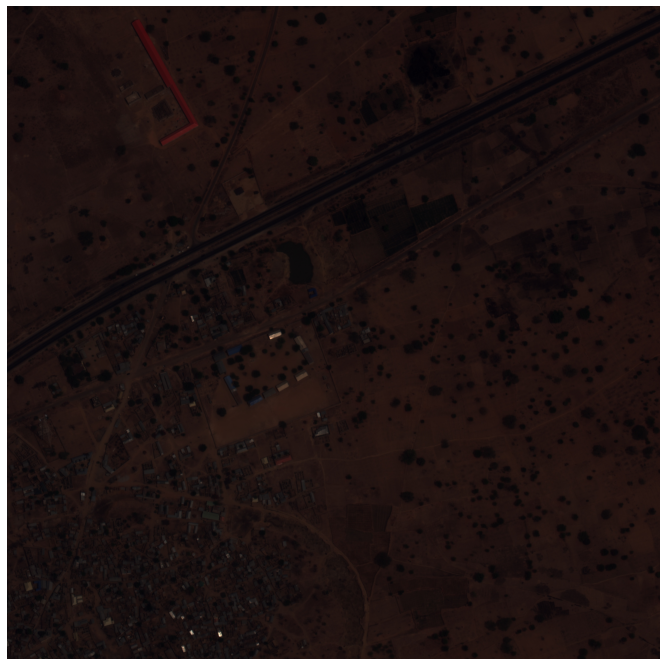

<Figure size 432x288 with 0 Axes>

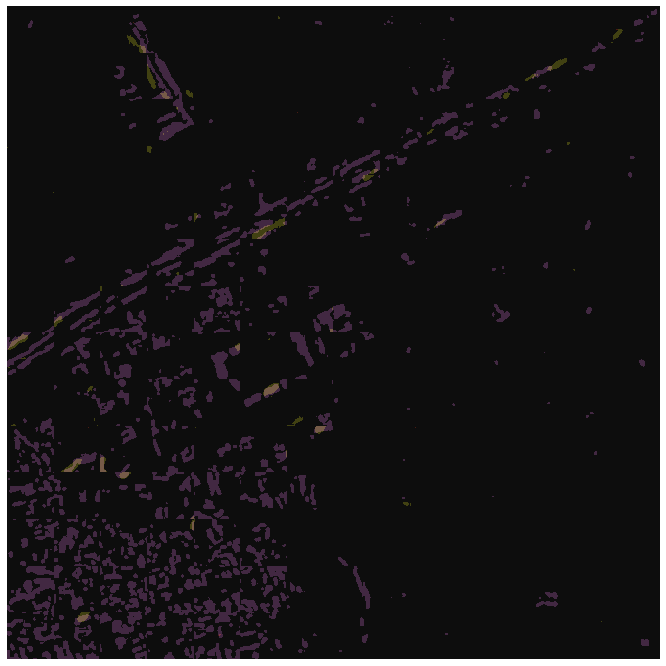

In [ ]:
start_time = timeit.default_timer()
predict_image('18', 0.6, 0.8, 0.0, 0.0, 0.3, 'none', True, False )
print("Elapsed Time: ", timeit.default_timer() - start_time)

(4631, 5325, 3)
(3584, 3584, 3)
(196, 256, 256, 3)
Elapsed Time:  52.741465966000305


<Figure size 432x288 with 0 Axes>

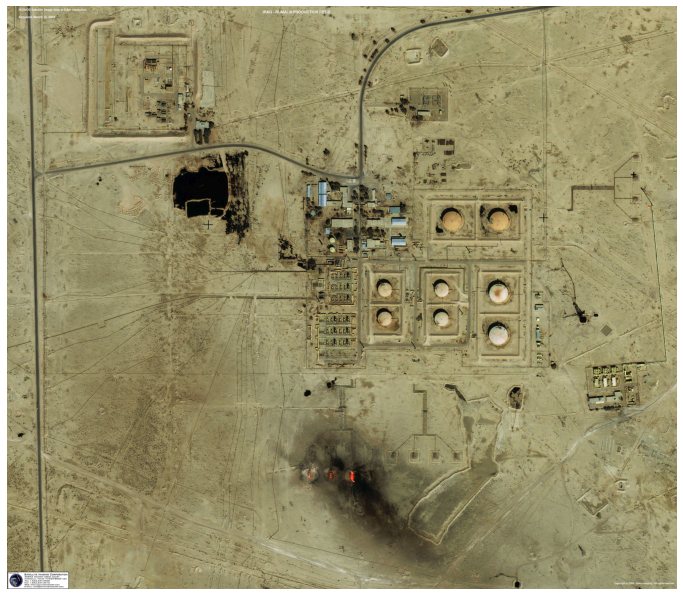

<Figure size 432x288 with 0 Axes>

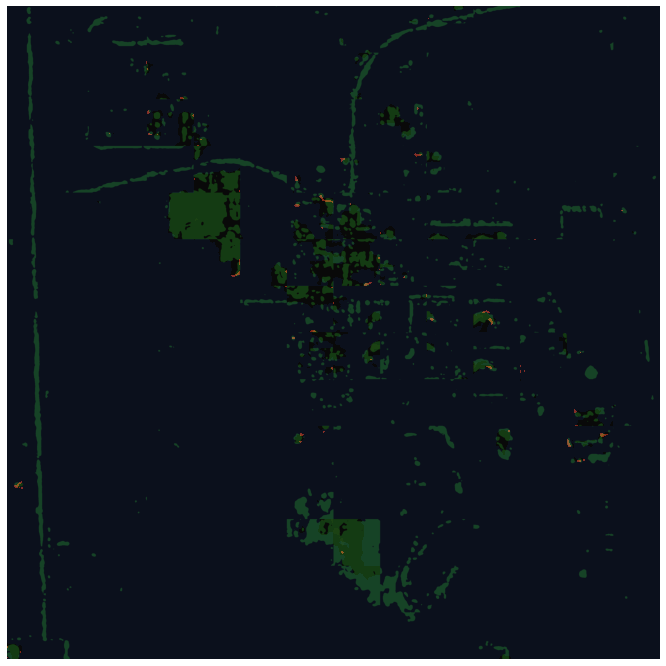

In [ ]:
start_time = timeit.default_timer()
predict_image('19',  0.0, 0.4, 0.8, 0.2, 0.6, 'none', True, False )
print("Elapsed Time: ", timeit.default_timer() - start_time)

(1491, 1922, 3)
(3584, 3584, 3)
(196, 256, 256, 3)
Elapsed Time:  49.06446437500017


<Figure size 432x288 with 0 Axes>

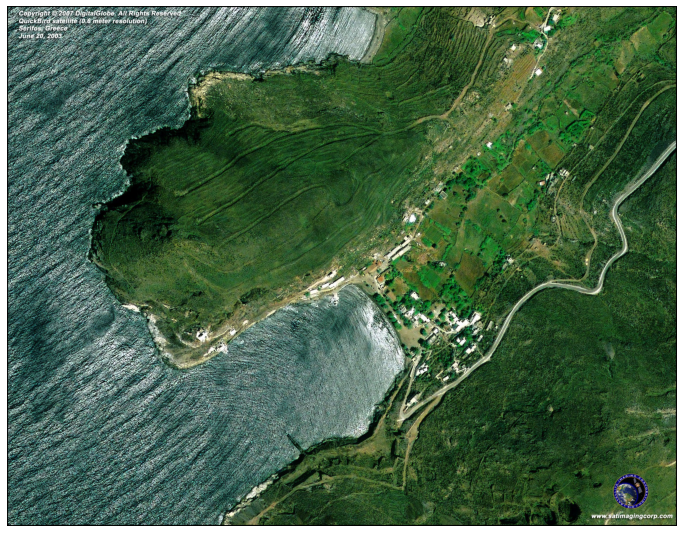

<Figure size 432x288 with 0 Axes>

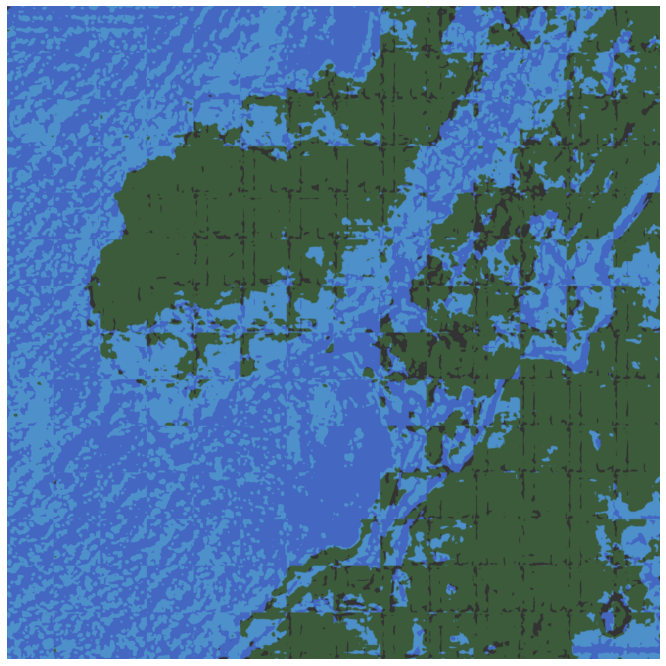

In [ ]:
start_time = timeit.default_timer()
predict_image('20', 0.0, 0.0, 0.5, 0.6, 0.0, 'gaussian', True, False )
print("Elapsed Time: ", timeit.default_timer() - start_time)